In [2]:
import torch
import torch_interpolations
import matplotlib.pyplot as plt
import numpy as np
import scipy.interpolate as interp
from PIL import Image
import os
import glob

In [3]:
def interpolate(x, y, res):
    x, y = x, y  ##self.poly.xy[:].T
    i = np.arange(len(x))

    interp_i = np.linspace(0, i.max(), res * i.max())

    xi = interp.interp1d(i, x, kind="cubic")(interp_i)
    yi = interp.interp1d(i, y, kind="cubic")(interp_i)

    return xi, yi

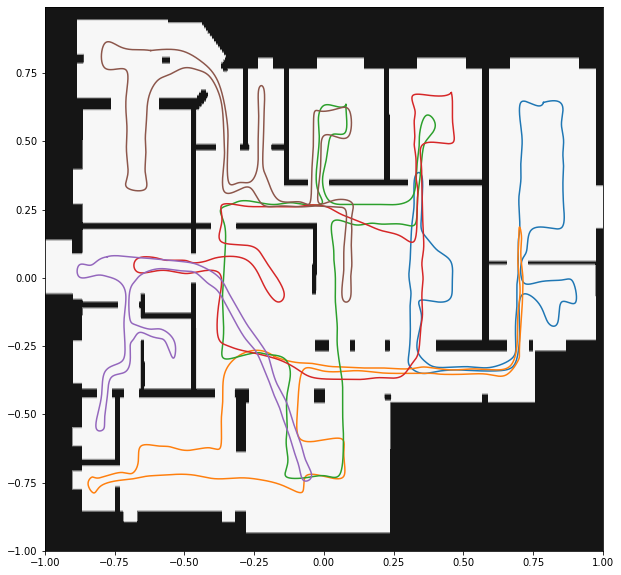

In [4]:
img_dir = "../32_data/" 
img_path = os.path.join(img_dir, "floor_img.png")
img = np.asarray(Image.open(img_path)).astype(float) / 255.0
img = torch.Tensor(img)

(ny, nx) = img.shape
xs = torch.linspace(-1, 1, nx)
ys = torch.linspace(-1, 1, ny)
gi = torch_interpolations.RegularGridInterpolator((xs, ys), img.T)
(X, Y) = torch.meshgrid(xs, ys)
X, Y = X.flatten().contiguous(), Y.flatten().contiguous()
X, Y = X[::8].contiguous(), Y[::8].contiguous() # subsample
densities = gi((X, Y))
(fig, ax) = plt.subplots(figsize=(10, 10))
ax.tricontourf(X, Y, densities, cmap=plt.get_cmap("Greys"))

traj_dir = os.path.join(img_dir, "tight_paths")
all_trajnames = glob.glob1(traj_dir, "*.npy")

for i in range(len(all_trajnames)):
    xy = np.load(os.path.join(traj_dir, all_trajnames[i]))
    x, y = xy[:, 0], xy[:, 1]
    xspline, yspline = interpolate(x, y, 120)
    ax.plot(xspline, yspline)
